## NeurIPS Decay and CGE nulls

### Imports

In [3]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
from env.imports import *

In [5]:
import importlib
import data

import models
import sim.sim
import sim.sim_utils
from sim.sim_utils import bytes2human, print_system_usage
from sim.sim import Simulation
from sim.sim_run import single_sim_run

#### Check job specs

In [6]:
print_system_usage()

total = psutil.disk_usage('/').total
print(bytes2human(total))

CPU Usage: 2.1%
RAM Usage: 14.9%
Available RAM: 320.7G
Total RAM: 376.8G
52.4G


In [7]:
print(os.environ.get("CUDA_VISIBLE_DEVICES"))

# Check available GPUs
print(f"Available GPUs: {torch.cuda.device_count()}")

for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: {torch.cuda.get_device_name(i)} - Memory Allocated: {torch.cuda.memory_allocated(i)/1024**3:.2f} GB")


None
Available GPUs: 0


### Data viz

In [8]:
from data.data_load import load_transcriptome, load_connectome, load_coords, load_network_labels
from data.data_viz import plot_connectome, plot_transcriptome
from data.data_utils import expand_X_symmetric, expand_Y_symmetric

In [9]:
X = load_transcriptome(parcellation='S400', hemisphere='both', omit_subcortical=False, sort_genes='chromosome', impute_strategy='mirror_interpolate')
Y = load_connectome(parcellation='S400', hemisphere='both', omit_subcortical=False)
coords = load_coords(parcellation='S400', hemisphere='both', omit_subcortical=False)
labels, network_labels = load_network_labels(parcellation='S400', hemisphere='both', omit_subcortical=False)

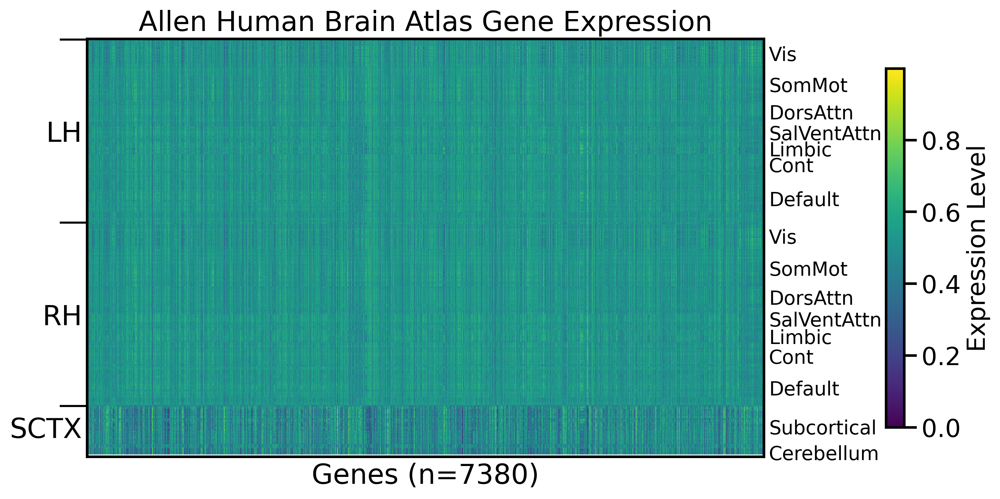

In [10]:
plot_transcriptome(null_model='none', parcellation='S400', hemisphere='both', omit_subcortical=False, gene_list='0.2', sort_genes='ref_genome', impute_strategy='mirror_interpolate') #, add_hemisphere_labels=True, add_network_labels=False)

### Spatial autocorr analysis

In [11]:
from sim.null import *

Number of components for 95% variance PCA: 27


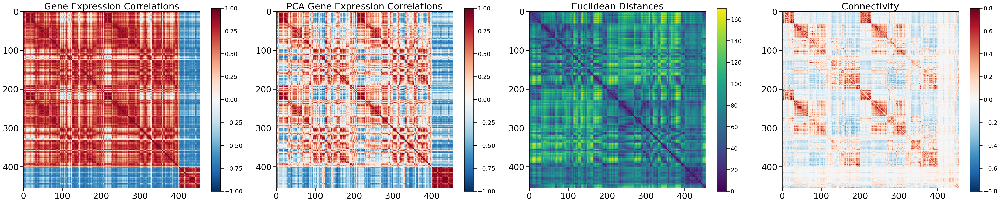

In [12]:
X, X_pca, Y, coords, labels, network_labels, X_corr, X_pca_corr, dist_matrix = load_and_plot_data(parcellation='S400', hemisphere='both', omit_subcortical=False, 
                      sort_genes='expression', impute_strategy='mirror_interpolate', null_model='none', fontsize=26)

features, features_cortex, features_subcortex = subset_brain_data(X, X_pca, Y, coords, labels, network_labels, X_corr, X_pca_corr, dist_matrix)

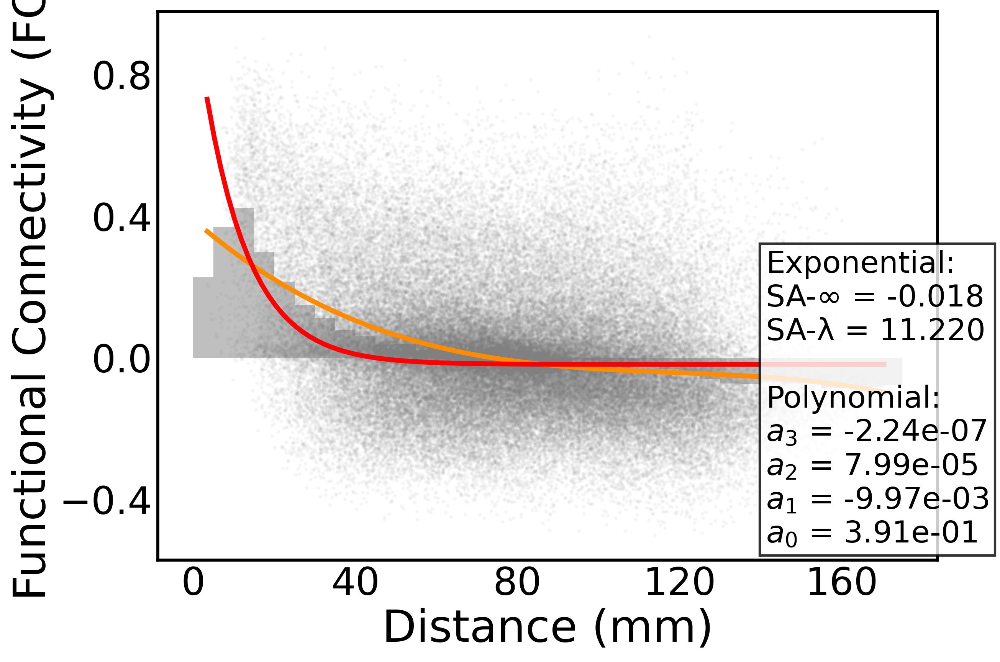

In [13]:
plot_distance_fits(features, 'FC', 5, 'Full Brain')


In [14]:
dist_matrix.shape

(455, 455)

### Distance and CGE baselines

In [16]:
Y_pred_gaussian_kernel = np.exp(-dist_matrix**2 / (2 * np.std(dist_matrix)**2))

print(np.std(dist_matrix))

29.74431646473431


Shapes:
Y_pred_gaussian_kernel: (455, 455)
Y_pred_exponential_decay: (455, 455)
Y_pred_CGE: (455, 455)
Y_pred_PCA_CGE: (455, 455)

Ranges:
Y_pred_gaussian_kernel: [0.000, 1.000]
Y_pred_exponential_decay: [-0.018, 1.000]
Y_pred_CGE: [-0.839, 1.000]
Y_pred_PCA_CGE: [-0.886, 1.000]


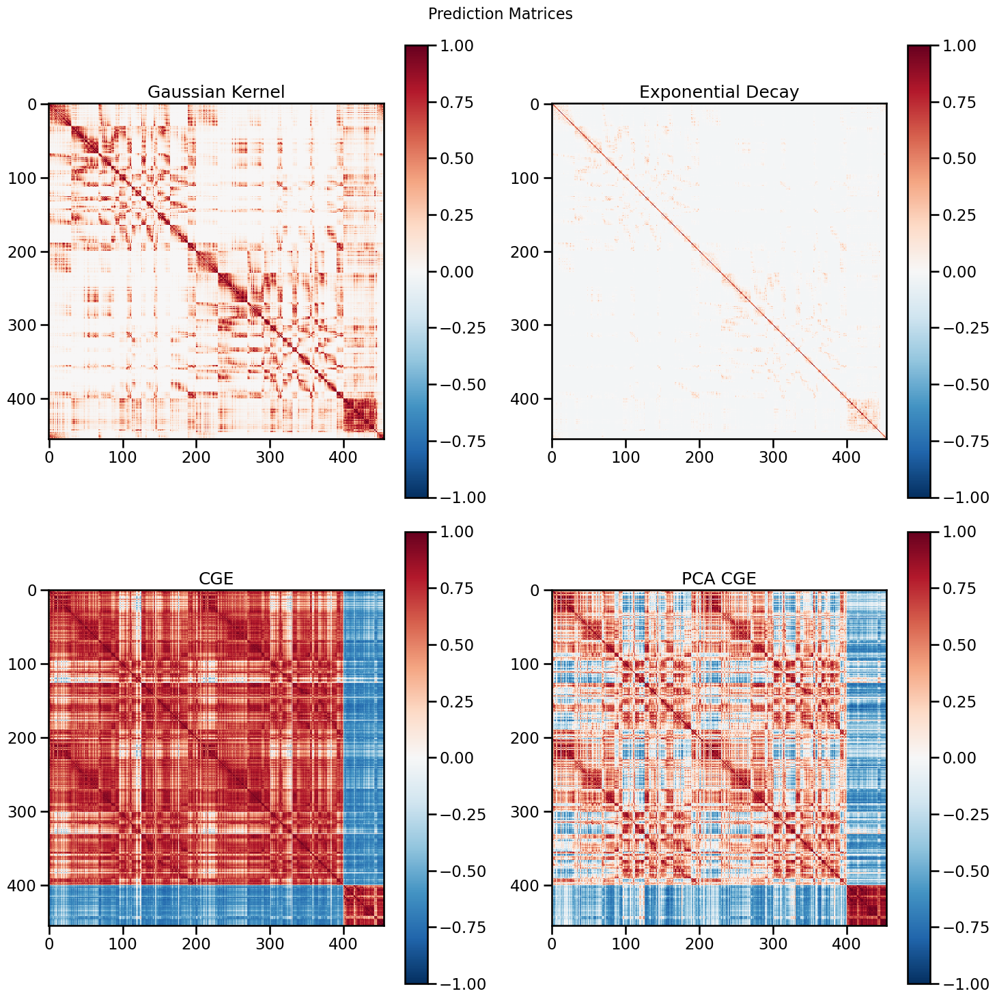

In [13]:
# Distance
Y_pred_gaussian_kernel = np.exp(-dist_matrix**2 / (2 * np.std(dist_matrix)**2))

Y_pred_exponential_decay = np.zeros_like(dist_matrix)
for i in range(dist_matrix.shape[0]):
    for j in range(dist_matrix.shape[1]):
        Y_pred_exponential_decay[i,j] = exp_decay(dist_matrix[i,j], -0.018, 11.22)

# CGE
Y_pred_CGE = X_corr
Y_pred_PCA_CGE = X_pca_corr

# Print shapes
print("Shapes:")
print(f"Y_pred_gaussian_kernel: {Y_pred_gaussian_kernel.shape}")
print(f"Y_pred_exponential_decay: {Y_pred_exponential_decay.shape}")
print(f"Y_pred_CGE: {Y_pred_CGE.shape}")
print(f"Y_pred_PCA_CGE: {Y_pred_PCA_CGE.shape}")

# Print ranges
print("\nRanges:")
print(f"Y_pred_gaussian_kernel: [{Y_pred_gaussian_kernel.min():.3f}, {Y_pred_gaussian_kernel.max():.3f}]")
print(f"Y_pred_exponential_decay: [{Y_pred_exponential_decay.min():.3f}, {Y_pred_exponential_decay.max():.3f}]")
print(f"Y_pred_CGE: [{Y_pred_CGE.min():.3f}, {Y_pred_CGE.max():.3f}]")
print(f"Y_pred_PCA_CGE: [{Y_pred_PCA_CGE.min():.3f}, {Y_pred_PCA_CGE.max():.3f}]")

# Plot each prediction matrix with consistent colormap and scale
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
fig.suptitle('Prediction Matrices', fontsize=16)

# Create a consisxfvdfgbdsgbcvbcxvbtent colormap and normalization
cmap = plt.cm.RdBu_r
norm = plt.Normalize(vmin=-1, vmax=11003
# Plot gaussian kernel
im0 = axes[0,0].imshow(Y_pred_gaussian_kernel, cmap=cmap, norm=norm)
axes[0,0].set_title('Gaussian Kernel')
plt.colorbar(im0, ax=axes[0,0])

# Plot exponential decay
im1 = axes[0,1].imshow(Y_pred_exponential_decay, cmap=cmap, norm=norm)
axes[0,1].set_title('Exponential Decay') 
plt.colorbar(im1, ax=axes[0,1])

# Plot CGE
im2 = axes[1,0].imshow(Y_pred_CGE, cmap=cmap, norm=norm)
axes[1,0].set_title('CGE')
plt.colorbar(im2, ax=axes[1,0])

# Plot PCA CGE
im3 = axes[1,1].imshow(Y_pred_PCA_CGE, cmap=cmap, norm=norm)
axes[1,1].set_title('PCA CGE')
plt.colorbar(im3, ax=axes[1,1])

plt.tight_layout()
plt.show()


### Subset to Test Set for Viz

In [14]:
from data.data_viz import plot_train_test_masked_connectome, plot_train_test_reordered_connectome
from data.cv_split import RandomCVSplit

X = load_transcriptome(parcellation='S400', hemisphere='both', omit_subcortical=False, sort_genes='refgenome', impute_strategy='mirror_interpolate')
Y = load_connectome(parcellation='S400', hemisphere='both', omit_subcortical=False)
coords = load_coords(parcellation='S400', hemisphere='both', omit_subcortical=False)
labels, network_labels = load_network_labels(parcellation='S400', hemisphere='both', omit_subcortical=False)

cv = RandomCVSplit(X, Y, num_splits=4, random_seed=42)
splits = list(cv.split())

train_idx, test_idx = splits[1]


In [15]:
test_idx

array([  2,   3,   6,   7,  10,  16,  18,  26,  29,  36,  38,  59,  60,
        63,  69,  74,  81,  83,  89,  92,  96, 103, 108, 109, 110, 111,
       114, 118, 119, 123, 139, 141, 143, 145, 147, 148, 150, 152, 157,
       158, 163, 165, 167, 173, 175, 176, 177, 184, 193, 194, 195, 196,
       198, 204, 208, 210, 211, 222, 225, 229, 231, 234, 238, 244, 245,
       249, 250, 253, 255, 265, 268, 271, 278, 286, 287, 289, 290, 311,
       317, 322, 323, 325, 329, 331, 333, 334, 335, 338, 342, 346, 351,
       352, 360, 364, 371, 375, 376, 382, 386, 392, 393, 399, 401, 407,
       415, 416, 422, 424, 425, 426, 428, 430, 437, 453])

Spinning gene expression
Spin index for seed 42: 9
Mean error rank for spin index 9: 263.3333333333333
Number of components for 95% variance PCA: 27
Spinning gene expression
Spin index for seed 42: 9
Mean error rank for spin index 9: 263.3333333333333


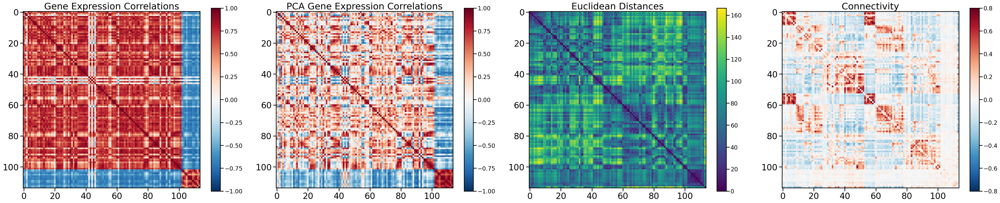

In [16]:
X, X_pca, Y, coords, labels, network_labels, X_corr, X_pca_corr, dist_matrix = load_and_plot_data(parcellation='S400', hemisphere='both', omit_subcortical=False, 
                      sort_genes='expression', impute_strategy='mirror_interpolate', null_model='spin', fontsize=26,
                      subset_indices=test_idx)

features, features_cortex, features_subcortex = subset_brain_data(X, X_pca, Y, coords, labels, network_labels, X_corr, X_pca_corr, dist_matrix)


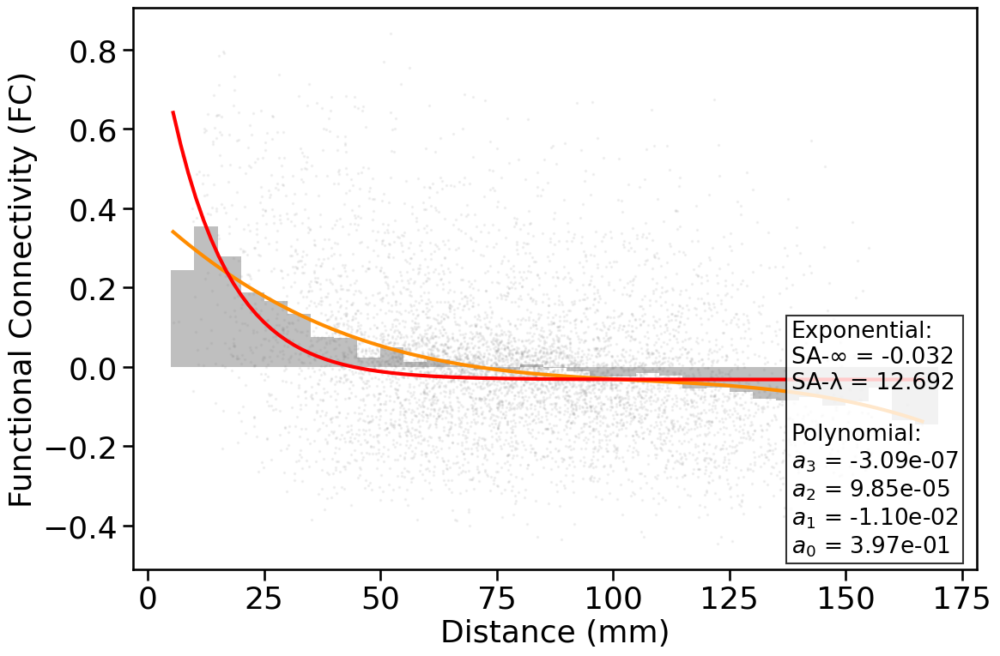

In [17]:

plot_distance_fits(features, 'FC', 5, 'Full Brain')

Shapes:
Y_pred_gaussian_kernel: (114, 114)
Y_pred_exponential_decay: (114, 114)
Y_pred_CGE: (114, 114)
Y_pred_PCA_CGE: (114, 114)

Ranges:
Y_pred_gaussian_kernel: [0.000, 0.984]
Y_pred_exponential_decay: [-0.020, 0.652]
Y_pred_CGE: [-0.833, 0.990]
Y_pred_PCA_CGE: [-0.857, 0.990]


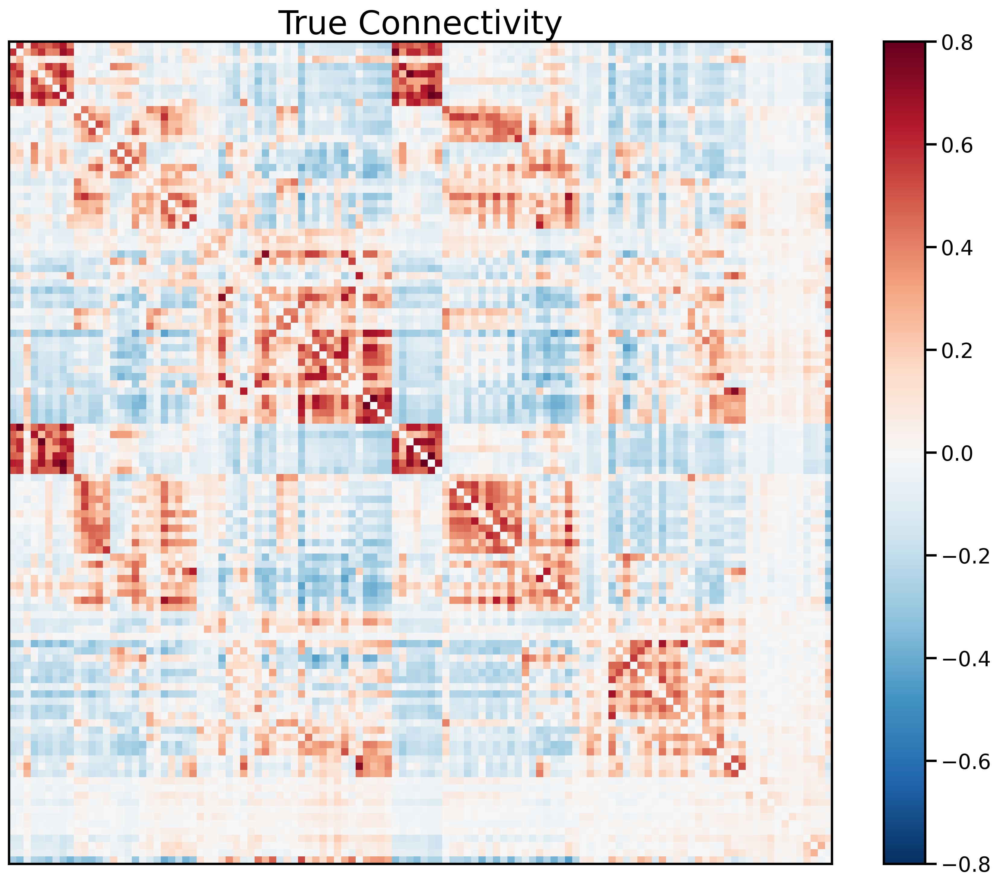

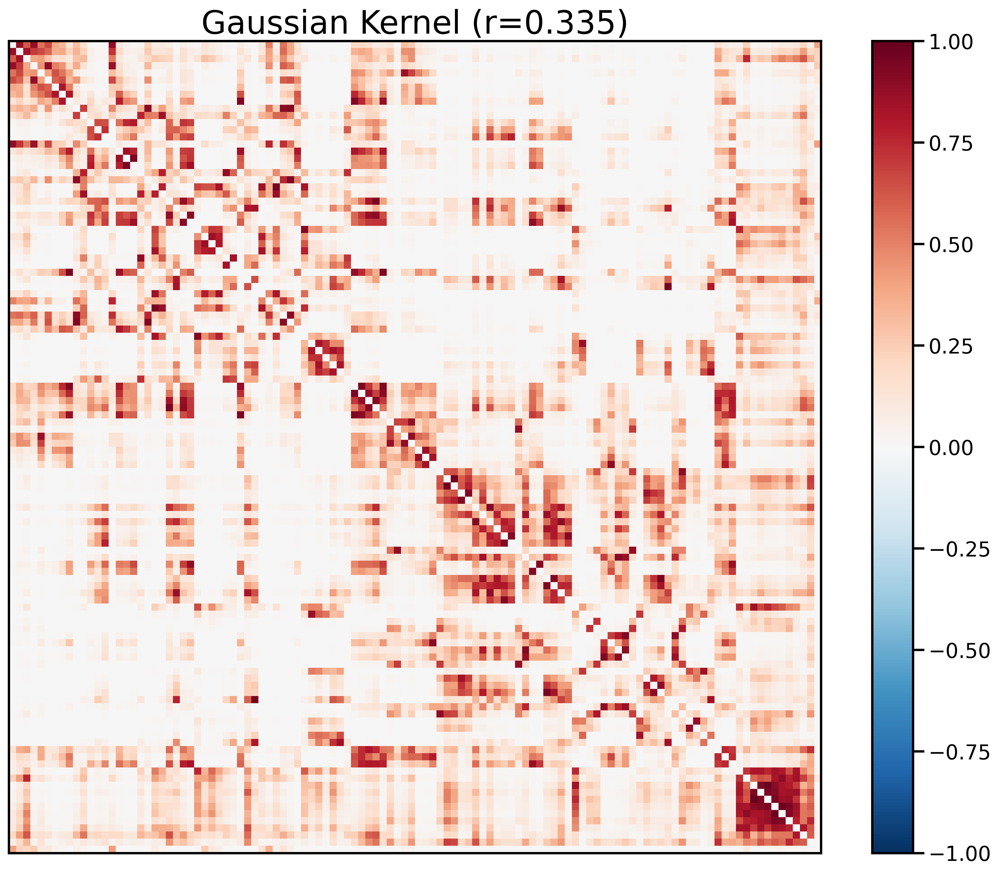

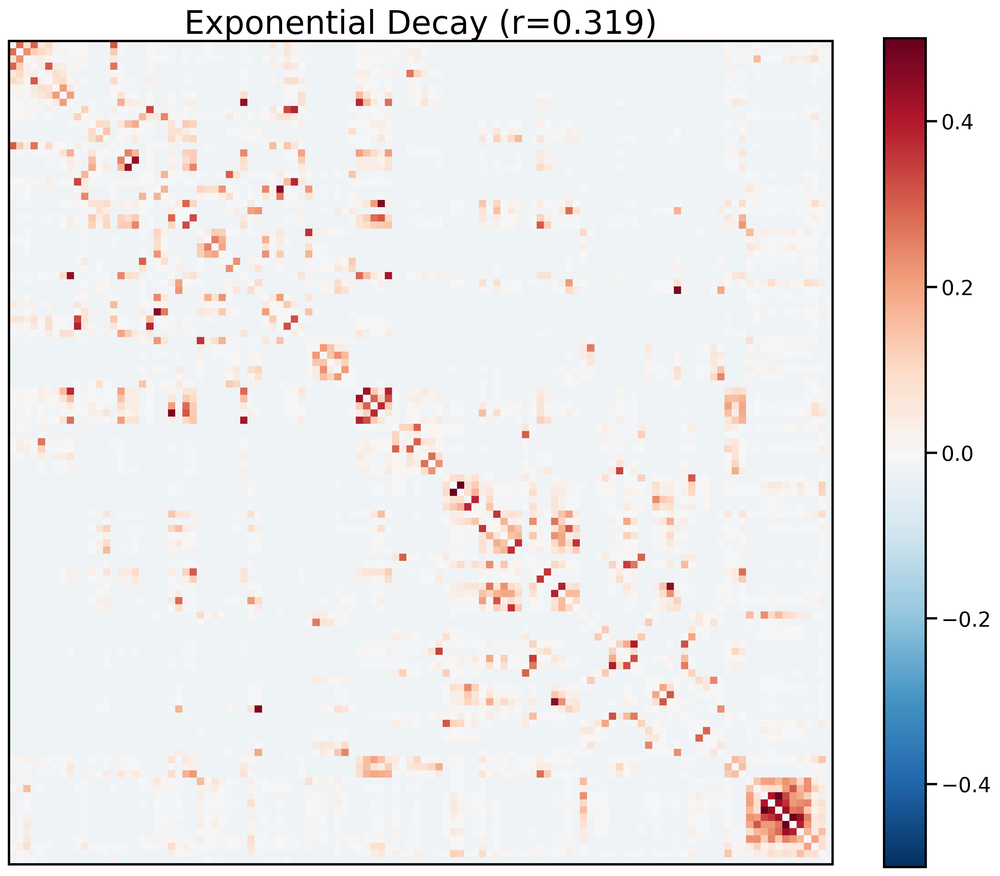

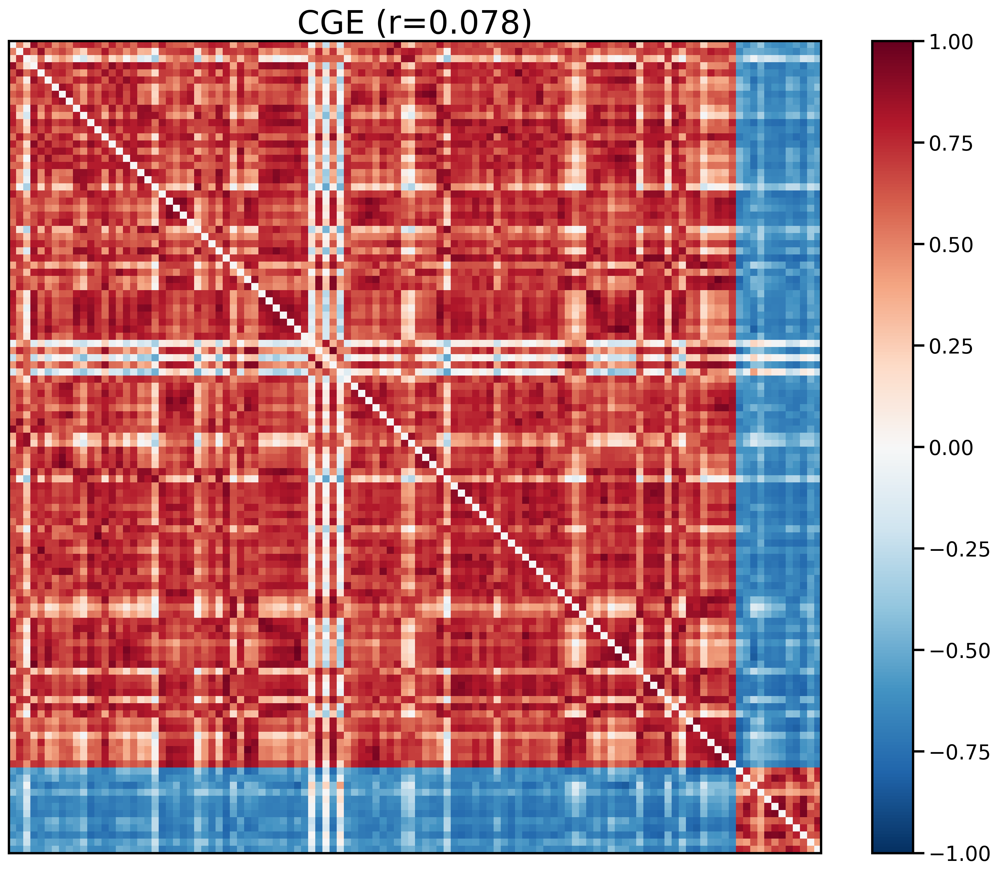

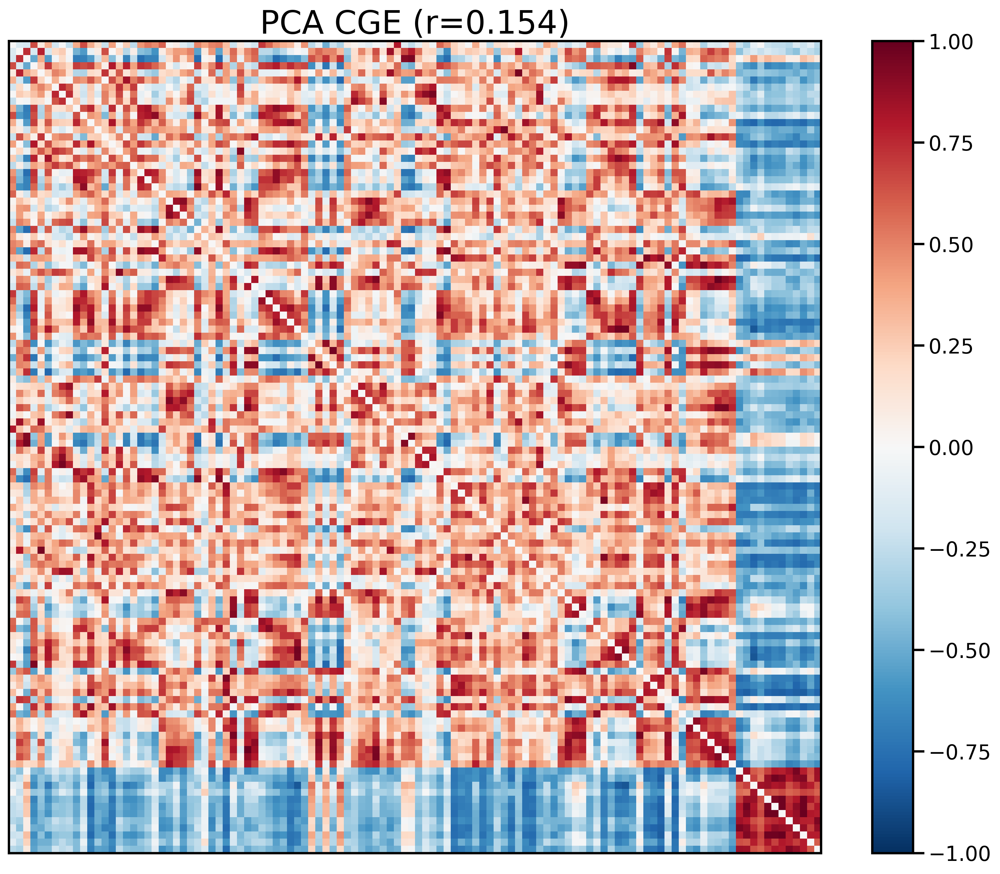

In [18]:
# Distance
Y_pred_gaussian_kernel = np.exp(-dist_matrix**2 / (2 * np.std(dist_matrix)**2))
np.fill_diagonal(Y_pred_gaussian_kernel, 0)

Y_pred_exponential_decay = np.zeros_like(dist_matrix)
for i in range(dist_matrix.shape[0]):
    for j in range(dist_matrix.shape[1]):
        Y_pred_exponential_decay[i,j] = exp_decay(dist_matrix[i,j], -0.02, 13)
np.fill_diagonal(Y_pred_exponential_decay, 0)

# CGE
Y_pred_CGE = X_corr
np.fill_diagonal(Y_pred_CGE, 0)

Y_pred_PCA_CGE = X_pca_corr
np.fill_diagonal(Y_pred_PCA_CGE, 0)

# Print shapes
print("Shapes:")
print(f"Y_pred_gaussian_kernel: {Y_pred_gaussian_kernel.shape}")
print(f"Y_pred_exponential_decay: {Y_pred_exponential_decay.shape}")
print(f"Y_pred_CGE: {Y_pred_CGE.shape}")
print(f"Y_pred_PCA_CGE: {Y_pred_PCA_CGE.shape}")

# Print ranges
print("\nRanges:")
print(f"Y_pred_gaussian_kernel: [{Y_pred_gaussian_kernel.min():.3f}, {Y_pred_gaussian_kernel.max():.3f}]")
print(f"Y_pred_exponential_decay: [{Y_pred_exponential_decay.min():.3f}, {Y_pred_exponential_decay.max():.3f}]")
print(f"Y_pred_CGE: [{Y_pred_CGE.min():.3f}, {Y_pred_CGE.max():.3f}]")
print(f"Y_pred_PCA_CGE: [{Y_pred_PCA_CGE.min():.3f}, {Y_pred_PCA_CGE.max():.3f}]")

# Plot settings
fontsize = 26
cmap = plt.cm.RdBu_r

# Plot true connectivity
plt.figure(figsize=(12, 10), dpi=300)
norm = plt.Normalize(vmin=-0.8, vmax=0.8)
im_true = plt.imshow(Y, cmap=cmap, norm=norm)
plt.title('True Connectivity', fontsize=fontsize)
plt.xticks([])
plt.yticks([])
plt.colorbar(im_true)
plt.tight_layout()
plt.show()

# Plot gaussian kernel
plt.figure(figsize=(12, 10), dpi=300)
norm = plt.Normalize(vmin=-1, vmax=1)
r = np.corrcoef(Y.flatten(), Y_pred_gaussian_kernel.flatten())[0,1]
im0 = plt.imshow(Y_pred_gaussian_kernel, cmap=cmap, norm=norm)
plt.title(f'Gaussian Kernel (r={r:.3f})', fontsize=fontsize)
plt.xticks([])
plt.yticks([])
plt.colorbar(im0)
plt.tight_layout()
plt.show()

# Plot exponential decay
plt.figure(figsize=(12, 10), dpi=300)
norm = plt.Normalize(vmin=-0.5, vmax=0.5)
r = np.corrcoef(Y.flatten(), Y_pred_exponential_decay.flatten())[0,1]
im1 = plt.imshow(Y_pred_exponential_decay, cmap=cmap, norm=norm)
plt.title(f'Exponential Decay (r={r:.3f})', fontsize=fontsize)
plt.xticks([])
plt.yticks([])
plt.colorbar(im1)
plt.tight_layout()
plt.show()

# Plot CGE
plt.figure(figsize=(12, 10), dpi=300)
norm = plt.Normalize(vmin=-1, vmax=1)
r = np.corrcoef(Y.flatten(), Y_pred_CGE.flatten())[0,1]
im2 = plt.imshow(Y_pred_CGE, cmap=cmap, norm=norm)
plt.title(f'CGE (r={r:.3f})', fontsize=fontsize)
plt.xticks([])
plt.yticks([])
plt.colorbar(im2)
plt.tight_layout()
plt.show()

# Plot PCA CGE
plt.figure(figsize=(12, 10), dpi=300)
norm = plt.Normalize(vmin=-1, vmax=1)
r = np.corrcoef(Y.flatten(), Y_pred_PCA_CGE.flatten())[0,1]
im3 = plt.imshow(Y_pred_PCA_CGE, cmap=cmap, norm=norm)
plt.title(f'PCA CGE (r={r:.3f})', fontsize=fontsize)
plt.xticks([])
plt.yticks([])
plt.colorbar(im3)
plt.tight_layout()
plt.show()


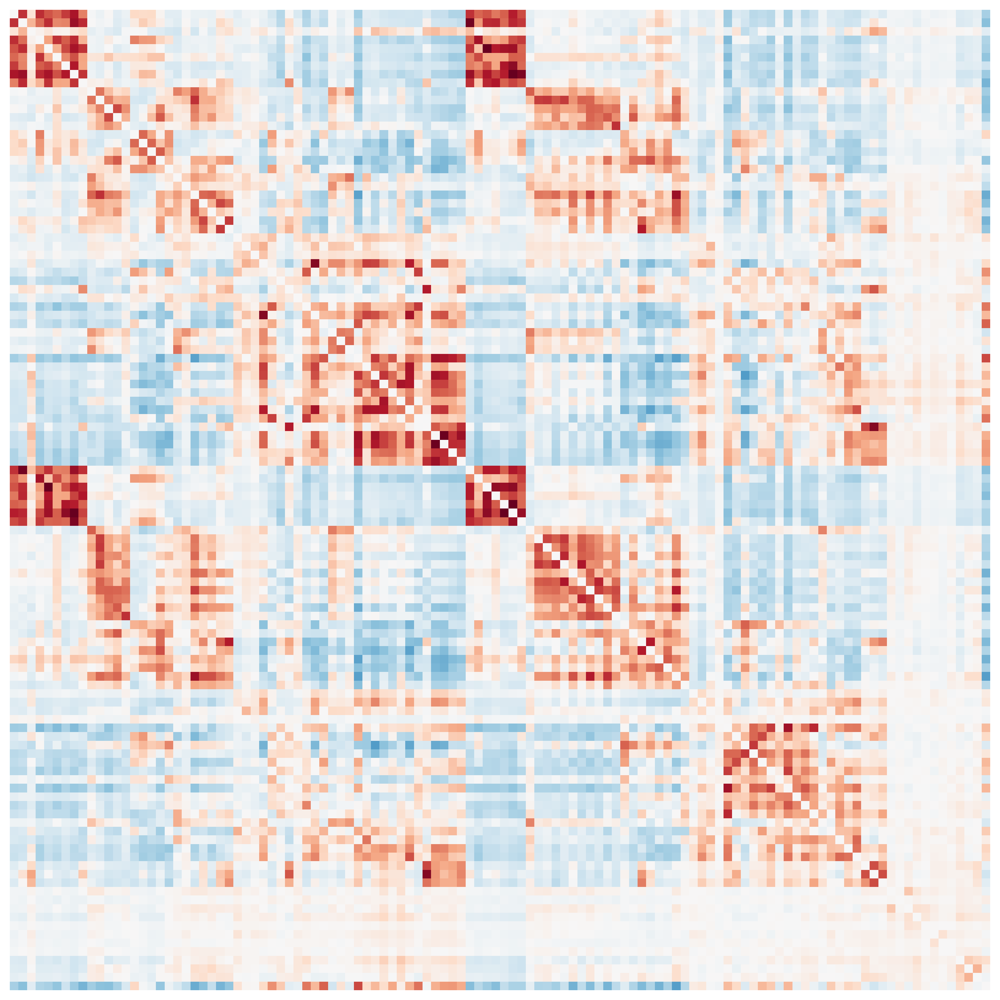

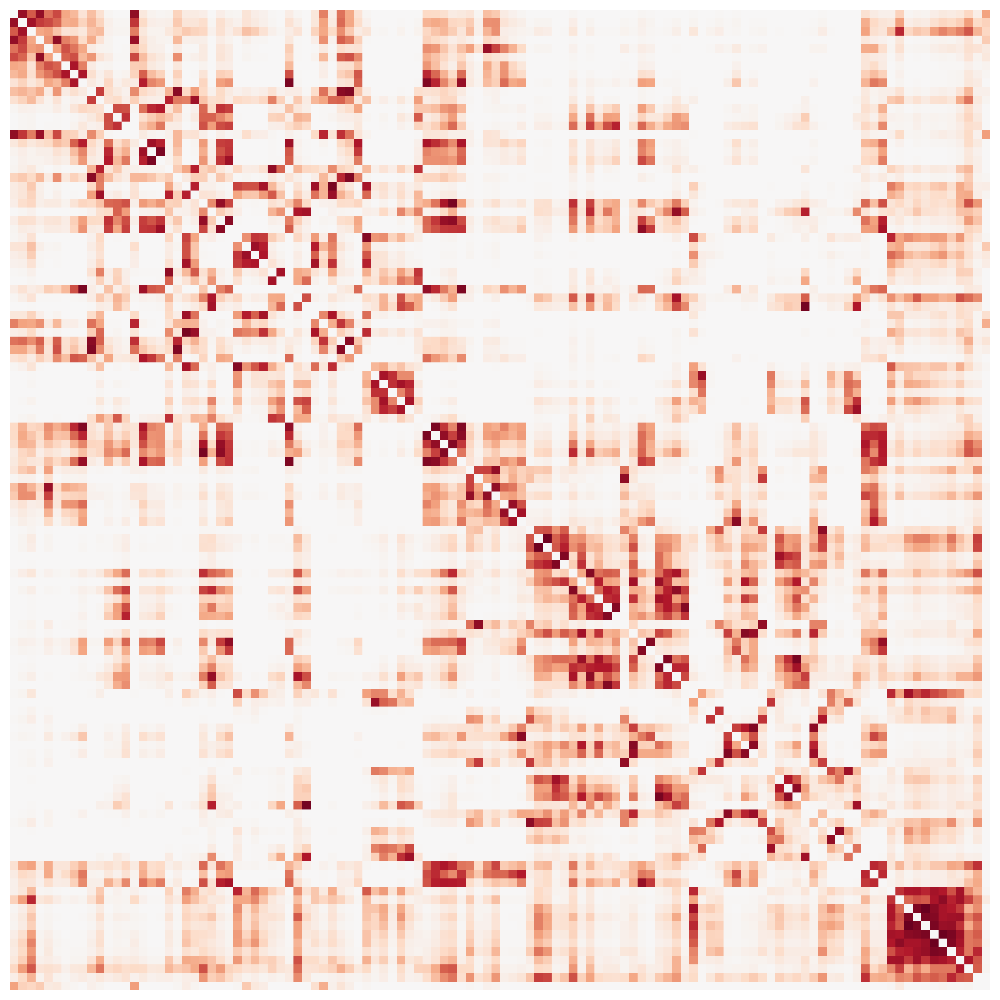

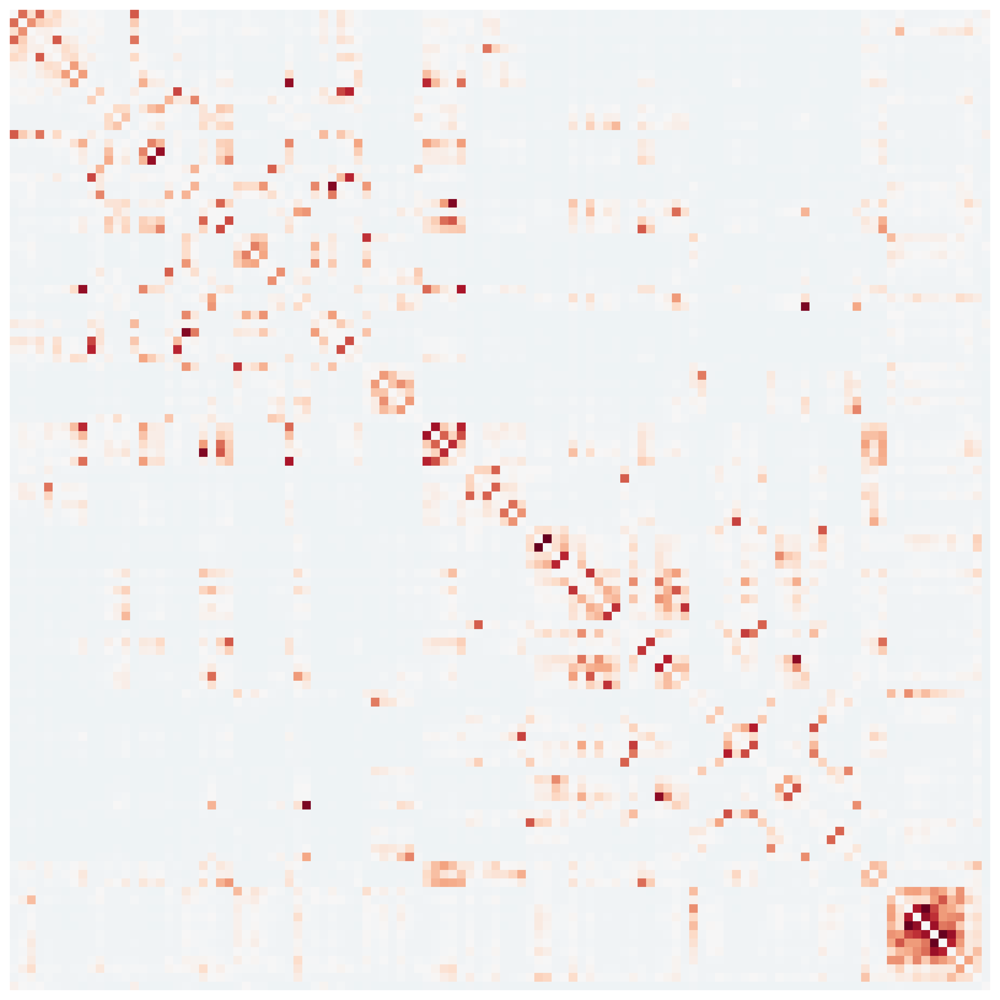

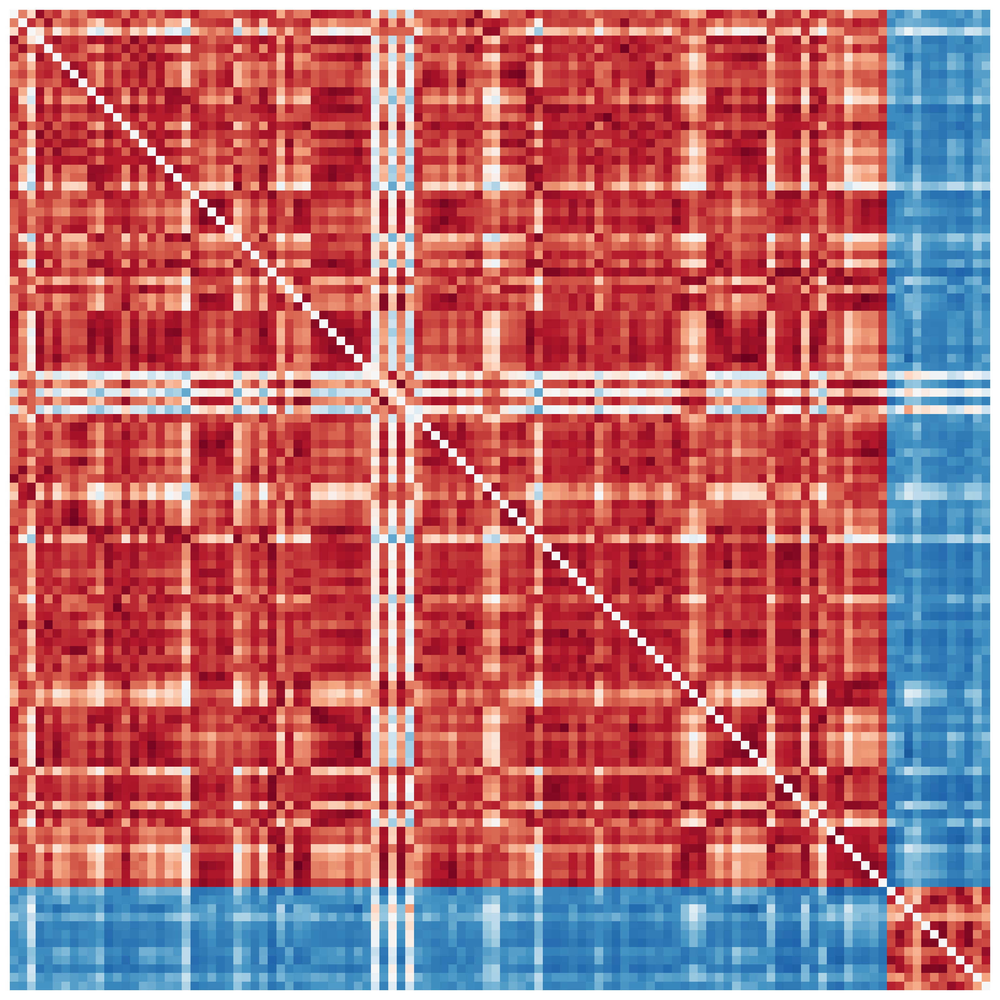

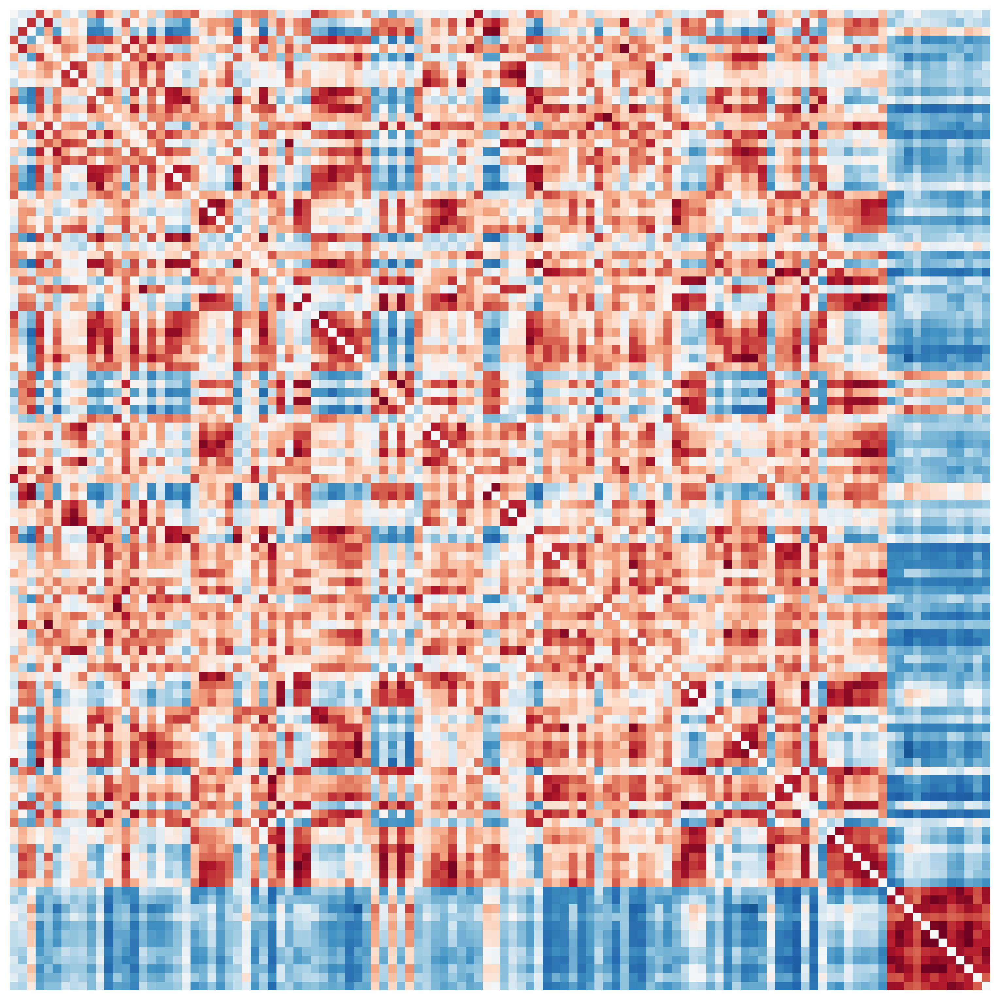

In [20]:
# Distance
Y_pred_gaussian_kernel = np.exp(-dist_matrix**2 / (2 * np.std(dist_matrix)**2))
np.fill_diagonal(Y_pred_gaussian_kernel, 0)

Y_pred_exponential_decay = np.zeros_like(dist_matrix)
for i in range(dist_matrix.shape[0]):
    for j in range(dist_matrix.shape[1]):
        Y_pred_exponential_decay[i,j] = exp_decay(dist_matrix[i,j], -0.02, 13)
np.fill_diagonal(Y_pred_exponential_decay, 0)

# CGE
Y_pred_CGE = X_corr
np.fill_diagonal(Y_pred_CGE, 0)

Y_pred_PCA_CGE = X_pca_corr
np.fill_diagonal(Y_pred_PCA_CGE, 0)

# Plot settings
cmap = plt.cm.RdBu_r

# Plot true connectivity
plt.figure(figsize=(12, 10), dpi=300)
plt.imshow(Y, cmap=cmap, vmin=-0.8, vmax=0.8)
plt.axis('off')
plt.subplots_adjust(0,0,1,1)
plt.show()

# Plot gaussian kernel
plt.figure(figsize=(12, 10), dpi=300)
plt.imshow(Y_pred_gaussian_kernel, cmap=cmap, vmin=-1, vmax=1)
plt.axis('off')
plt.subplots_adjust(0,0,1,1)
plt.show()

# Plot exponential decay
plt.figure(figsize=(12, 10), dpi=300)
plt.imshow(Y_pred_exponential_decay, cmap=cmap, vmin=-0.5, vmax=0.5)
plt.axis('off')
plt.subplots_adjust(0,0,1,1)
plt.show()

# Plot CGE
plt.figure(figsize=(12, 10), dpi=300)
plt.imshow(Y_pred_CGE, cmap=cmap, vmin=-1, vmax=1)
plt.axis('off')
plt.subplots_adjust(0,0,1,1)
plt.show()

# Plot PCA CGE
plt.figure(figsize=(12, 10), dpi=300)
plt.imshow(Y_pred_PCA_CGE, cmap=cmap, vmin=-1, vmax=1)
plt.axis('off')
plt.subplots_adjust(0,0,1,1)
plt.show()


### Results output

In [47]:
from models.metrics.eval import * 
import models.metrics.distance_FC


def get_distance_based_correlations(distances, y_true, y_pred):
    """
    Calculate correlations for different distance ranges.
    """
    # Calculate fixed distance cutoffs for short/mid/long range
    dist_min = 0
    dist_max = 175
    dist_range = dist_max - dist_min
    dist_33 = dist_min + (dist_range / 3)
    dist_67 = dist_min + (2 * dist_range / 3)
    
    # Create masks for different ranges
    short_mask = distances <= dist_33
    mid_mask = (distances > dist_33) & (distances <= dist_67)
    long_mask = distances > dist_67
    
    # Calculate correlations for each range
    overall_corr = pearsonr(y_true, y_pred)[0]
    short_range_corr = pearsonr(y_true[short_mask], y_pred[short_mask])[0]
    mid_range_corr = pearsonr(y_true[mid_mask], y_pred[mid_mask])[0]
    long_range_corr = pearsonr(y_true[long_mask], y_pred[long_mask])[0]
    
    return overall_corr, short_range_corr, mid_range_corr, long_range_corr

In [48]:
print("Shapes:")
# Remove diagonal and flatten each matrix
Y_pred_gaussian_kernel_flat = Y_pred_gaussian_kernel[~np.eye(Y_pred_gaussian_kernel.shape[0], dtype=bool)].flatten()
Y_pred_exponential_decay_flat = Y_pred_exponential_decay[~np.eye(Y_pred_exponential_decay.shape[0], dtype=bool)].flatten()
Y_pred_CGE_flat = Y_pred_CGE[~np.eye(Y_pred_CGE.shape[0], dtype=bool)].flatten()
Y_pred_PCA_CGE_flat = Y_pred_PCA_CGE[~np.eye(Y_pred_PCA_CGE.shape[0], dtype=bool)].flatten()
Y_flat = Y[~np.eye(Y.shape[0], dtype=bool)].flatten()
dist_matrix_flat = dist_matrix[~np.eye(dist_matrix.shape[0], dtype=bool)].flatten()

print(f"Y_pred_gaussian_kernel: {Y_pred_gaussian_kernel_flat.shape}")
print(f"Y_pred_exponential_decay: {Y_pred_exponential_decay_flat.shape}")
print(f"Y_pred_CGE: {Y_pred_CGE_flat.shape}")
print(f"Y_pred_PCA_CGE: {Y_pred_PCA_CGE_flat.shape}")
print(f"Y: {Y_flat.shape}")
print(f"dist_matrix: {dist_matrix_flat.shape}")

# Create empty dataframe with metrics columns
metrics_df = pd.DataFrame(columns=['Model', 'Pearson-r', 'R²', 'MSE', 'Geodesic', 'Short-range r', 'Mid-range r', 'Long-range r'])

# Calculate metrics for Gaussian Kernel model
overall_r_gauss, short_r_gauss, mid_r_gauss, long_r_gauss = get_distance_based_correlations(
    dist_matrix_flat, Y_flat, Y_pred_gaussian_kernel_flat)
r2_gauss = r2_score(Y_flat, Y_pred_gaussian_kernel_flat)
mse_gauss = mean_squared_error(Y_flat, Y_pred_gaussian_kernel_flat)
geodesic_gauss = distance_FC(Y, Y_pred_gaussian_kernel).geodesic()

# Add Gaussian Kernel results
metrics_df.loc[0] = ['Dist. Gaussian Kernel', overall_r_gauss, r2_gauss, mse_gauss, geodesic_gauss,
                     short_r_gauss, mid_r_gauss, long_r_gauss]

# Calculate metrics for Exponential Decay model  
overall_r_exp, short_r_exp, mid_r_exp, long_r_exp = get_distance_based_correlations(
    dist_matrix_flat, Y_flat, Y_pred_exponential_decay_flat)
r2_exp = r2_score(Y_flat, Y_pred_exponential_decay_flat)
mse_exp = mean_squared_error(Y_flat, Y_pred_exponential_decay_flat)
geodesic_exp = distance_FC(Y, Y_pred_exponential_decay).geodesic()

# Add Exponential Decay results
metrics_df.loc[1] = ['Dist. Exp. Decay', overall_r_exp, r2_exp, mse_exp, geodesic_exp,
                     short_r_exp, mid_r_exp, long_r_exp]

# Calculate metrics for CGE model
overall_r_cge, short_r_cge, mid_r_cge, long_r_cge = get_distance_based_correlations(
    dist_matrix_flat, Y_flat, Y_pred_CGE_flat)
r2_cge = r2_score(Y_flat, Y_pred_CGE_flat)
mse_cge = mean_squared_error(Y_flat, Y_pred_CGE_flat)
geodesic_cge = distance_FC(Y, Y_pred_CGE).geodesic()

# Add CGE results
metrics_df.loc[2] = ['CGE', overall_r_cge, r2_cge, mse_cge, geodesic_cge,
                     short_r_cge, mid_r_cge, long_r_cge]

# Calculate metrics for PCA CGE model
overall_r_pca, short_r_pca, mid_r_pca, long_r_pca = get_distance_based_correlations(
    dist_matrix_flat, Y_flat, Y_pred_PCA_CGE_flat)
r2_pca = r2_score(Y_flat, Y_pred_PCA_CGE_flat)
mse_pca = mean_squared_error(Y_flat, Y_pred_PCA_CGE_flat)
geodesic_pca = distance_FC(Y, Y_pred_PCA_CGE).geodesic()

# Add PCA CGE results
metrics_df.loc[3] = ['PCA CGE', overall_r_pca, r2_pca, mse_pca, geodesic_pca,
                     short_r_pca, mid_r_pca, long_r_pca]

print(metrics_df)

# Format metrics to 3 decimal places
formatted_metrics = metrics_df.copy()
formatted_metrics.iloc[:,1:] = formatted_metrics.iloc[:,1:].applymap(lambda x: f"{x:.3f}")

# Create LaTeX table
latex_table = """\\begin{table}
  \\caption{Performance comparison of different models on structural connectivity prediction}
  \\label{tab:model-comparison}
  \\centering
  \\small
  \\begin{tabular}{lcccccccc}
    \\toprule
    Model & Pearson-r & R² & MSE & Geodesic & Short-range r & Mid-range r & Long-range r \\\\
    \\midrule"""

# Find best and second best values for each metric column
best_values = {}
second_best_values = {}
for col in metrics_df.columns[1:]:  # Skip Model column
    values = metrics_df[col].values
    if col in ['MSE', 'Geodesic']:  # For these metrics, lower is better
        best_values[col] = min(values)
        second_best_values[col] = sorted(values)[1]
    else:  # For other metrics, higher is better
        best_values[col] = max(values)
        second_best_values[col] = sorted(values, reverse=True)[1]

# Add each row
for _, row in formatted_metrics.iterrows():
    model_name = row['Model']
    latex_row = [model_name]
    
    for col in formatted_metrics.columns[1:]:
        value = row[col]
        numeric_val = float(value)
        if numeric_val == best_values[col]:
            value = "\\textbf{" + value + "}"
        elif numeric_val == second_best_values[col]:
            value = "\\textit{" + value + "}"
        latex_row.append(value)
        
    latex_table += "\n    " + " & ".join(latex_row) + " \\\\"

latex_table += """
    \\bottomrule
  \\end{tabular}
\\end{table}"""

print(latex_table)


Shapes:
Y_pred_gaussian_kernel: (206570,)
Y_pred_exponential_decay: (206570,)
Y_pred_CGE: (206570,)
Y_pred_PCA_CGE: (206570,)
Y: (206570,)
dist_matrix: (206570,)
                   Model  Pearson-r         R²       MSE    Geodesic  \
0  Dist. Gaussian Kernel   0.330072  -0.826606  0.061261  191.504032   
1       Dist. Exp. Decay   0.323947   0.082988  0.030755   25.911007   
2                    CGE   0.107831 -11.165837  0.408020   83.095587   
3                PCA CGE   0.223095  -4.938365  0.199162  638.276420   

   Short-range r  Mid-range r  Long-range r  
0       0.377051     0.069912      0.096798  
1       0.394116     0.068233      0.097646  
2       0.176867     0.052777      0.036616  
3       0.246300     0.116575      0.187161  
\begin{table}
  \caption{Performance comparison of different models on structural connectivity prediction}
  \label{tab:model-comparison}
  \centering
  \small
  \begin{tabular}{lcccccccc}
    \toprule
    Model & Pearson-r & R² & MSE & Geodesic &